<a href="https://colab.research.google.com/github/LivroRelampagos/Estudo_de_Caso/blob/main/plota_flashlma_individual_lagrangeano.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Plota LMA3D para cada flash individualmente**

---
**OBJETIVO:** Este Google Colab plota mapa das fontes de VHF de um relâmpago da rede SPLMA da campanha CHUVA-Vale.



---



**DADOS DE ENTRADA**: Relâmpagos 
- **Tipo do dado:** Fontes de VHF da SPLMA level_2 da campanha CHUVA-Vale
- **Formato do dado:** arquivo ASCII 
- **Nome do arquivo:** tempestade_7_20120109_1743.csv
- **Gerado por:** Enrique Mattos - IRN/UNIFEI  

---

**DADOS DE SAÍDA:** Figura da distribuição 3D de relâmpagos
- **Tipo do dado:** Figura
- **Formato do dado:** arquivo PNG 
- **Nome do arquivo:** FlashLMA_flash1_2012-01-09_17-43-10.569983.png
- **Gerado por:** Enrique Mattos - IRN/UNIFEI 

---

**PROCEDIMENTO REALIZADO:** Os seguintes procedimentos são realizados nesse código:
1.   Instalação de bibliotecas
2.   Importação das bibliotecas
3.   Cria pasta para as figuras geradas
4.   Define a que plota lma3D
5.   Define a função que lê os dados de relampagos por imagem de radar
6.   Plota figuras
7.   Cálculo e plotagem das figuras


---
**OBSERVAÇÕES IMPORTANTES**: 
**OBSERVAÇÕES IMPORTANTES**: 
1. Fazer mudanças, veja em: **### >>> MUDANÇAS AQUI <<< ###**
    - 1. Caminho do seu drive 
    - 2. Número da tempestade
    - 3. Data e hora da imagem do slice


---

- **Realizado por:** Enrique V. Mattos - 11/12/2021
- **Atualizado por:** Enrique V. Mattos e Raquel Gonçalves Pereira - 10/03/2022

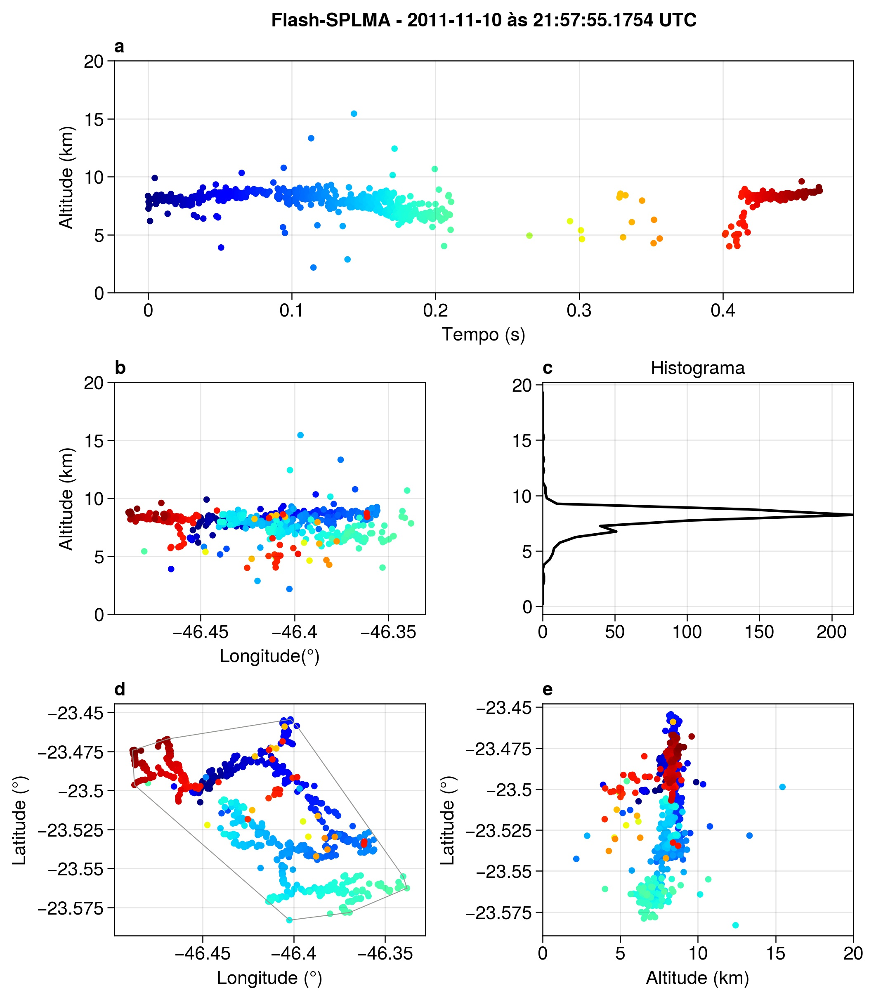

# **### >>> MUDANÇAS AQUI <<< ###**

- **Insira o caminho do seu drive**: alterar aqui

In [ ]:
dir = '/content/drive/MyDrive/Mestrado/LIVRO_RAQUEL/'

- **Defina o horário da imagem**: alterar aqui

In [ ]:
anox, mesx, diax, horx, minx = '2012', '01', '09', '17', '43'

- **Caminhos dos diretórios**: aqui não precisa alterar

In [ ]:
# definindo os caminhos 
path_input = f'{dir}1_rastreamento_tempestades_radar_FCTH/output/'  # caminho do arquivo de rastreamento da tempestade
path_output = f'{dir}7_plota_flashlma_individual/output/' # caminho onde as figuras serão salvas

# exibe na tela
print(path_input)
print(path_output)

/content/drive/MyDrive/Mestrado/LIVRO_RAQUEL/1_rastreamento_tempestades_radar_FCTH/output/
/content/drive/MyDrive/Mestrado/LIVRO_RAQUEL/7_plota_flashlma_individual/output/


# **Instala o Proplot**

In [ ]:
!pip install proplot

     |████████████████████████████████| 8.0 MB 3.8 MB/s 


# **Importa bibliotecas**

**importa bibliotecas**

In [ ]:
import pandas as pd
from datetime import datetime
import numpy as np
import matplotlib.pyplot as plt
import glob
import os
import proplot as plot
from scipy.spatial import ConvexHull, convex_hull_plot_2d

import warnings
warnings.filterwarnings("ignore")

/usr/local/lib/python3.7/dist-packages/proplot/__init__.py:71: ProplotWarning: Rebuilding font cache. This usually happens after installing or updating proplot.
  register_fonts(default=True)


**monta drive para salvar arquivos de saída**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **Cria a pasta para as figuras de sáida**

In [ ]:
import os
os.makedirs(f'{path_output}', exist_ok=True)

# **Define a função que plota o Mapa de LMA 3D**

In [ ]:
def plota_flashlma_individual(path_output, flash_id, df, area, duracao, comprimento):

    """
    Função que plota as fontes de VHF de um flash de forma 3D da SPLMA level_2

    Parâmetros:
                path_output (string): caminho de saída para as figuras que serão geradas
                flash_id (string): número sequêncial do flash daquela imagem de radar
                df (DataFrame): dataframe com as informações de relmpagos.
                              Exemplo: 
                                ano	   mes	dia	hor min	  seg	        lat     	lon     alt     segint  microseg	tempo
                            0	2012	1	9	17	47	59.844246	-22.9249	-47.0515	10.9280	    59	    844245	0.000000
                            1	2012	1	9	17	47	59.872253	-22.9303	-47.0591	11.5377	    59	    872253	0.028008
                            2	2012	1	9	17	47	59.892536	-22.9443	-47.0508	10.1454	    59	    892535	0.048290
                area (float): área do relâmpago (km2)
                duracao (float): duração do relâmpago (s)
                comprimento (float): comprimento do relâmpago (km)

    Retorna:
             figura png
    """

    #---------------------------------#
    # Extrai data do arquivo
    #---------------------------------#
    #file_name = os.path.basename(os.path.splitext(file)[0])
    ano = str(df.iloc[0,0])
    mes = str(df.iloc[0,1]).zfill(2)
    dia = str(df.iloc[0,2]).zfill(2)
    hor = str(df.iloc[0,3]).zfill(2)
    minu = str(df.iloc[0,4]).zfill(2)
    seg = str(df.iloc[0,5])

    #---------------------------------#
    # Extrai a qte de fontes do relãmpago
    #---------------------------------#
    nfontes = df.shape[0]

    #---------------------------------#
    # Cria moldura da figura: 
    #---------------------------------#
    # https://proplot.readthedocs.io/en/latest/basics.html#ug-subplot
    gs = plot.GridSpec(nrows=3, ncols=2, pad=1)
    fig = plot.figure(span=False, figsize=(7, 8), sharey=False, sharex=False)

    #---------------------------------#
    # Figura a: Altura x Tempo
    #---------------------------------#
    ax = fig.subplot(gs[0, :])
    ax.scatter(df['tempo'], df['alt'], c=df['tempo'], s=10, cmap='jet', label=f'fontes={nfontes}')

    ax.scatter(0, 0, s=0, cmap='jet', label=f'duração={duracao:.2f} s')  
    ax.scatter(0, 0, s=0, cmap='jet', label=f'area={area:.2f} km$^{2} $')  
    ax.scatter(0, 0, s=0, cmap='jet', label=f'comp.={comprimento:.2f} km')  

    ax.format(ylim=(0, 15), xlabel='Tempo (s)', ylabel='Altitude (km)', yticks=([0, 5, 10, 15]), small='15px', xtickminor=False, ytickminor=False)
    ax.legend(frameon=False, ncols=1)

    #---------------------------------#
    # Figura b: Altura x Longitude
    #---------------------------------#
    ax = fig.subplot(gs[1,0])
    ax.scatter(df['lon'], df['alt'], c=df['tempo'], s=10, cmap='jet')
    ax.format(ylim=(0, 15), xlabel='Longitude (°)', ylabel='Altitude (km)', yticks=([0, 5, 10, 15]), xtickminor=False, ytickminor=False, small='15px')

    #---------------------------------#
    # Figura c: Histograma
    #---------------------------------#
    ax = fig.subplot(gs[1, 1])
    classes = np.arange(0, 20, 0.5)
    y, edges = np.histogram(df['alt'], classes)
    centers = 0.5*(edges[1:] + edges[:-1])
    ax.plot(y, centers,color='black')
    
    ax.format(title='Histograma', small='15px', xlim=[0, max(y)], xtickminor=False, ytickminor=False)
    ax.legend(loc='ur', frameon=False)

    #---------------------------------#
    # Figura d: Latitude x Longitude
    #---------------------------------#
    ax = fig.subplot(gs[2, 0])
    ax.scatter(df['lon'], df['lat'], c=df['tempo'], s=10, cmap='jet')

    # plota o convex hull
    vet1 = df['lon'].values
    vet2 = df['lat'].values
    matriz =  np.column_stack((vet1, vet2))
    
    np.savetxt('matriz.txt', matriz, delimiter=" ", fmt="%s") 
    points = np.loadtxt('matriz.txt')  
    
    hull = ConvexHull(points)
    area = hull.area
    area = '#Area: %2.2f' % area

    for simplex in hull.simplices:
        ax.plot(points[simplex, 0], points[simplex, 1], color='gray', lw=0.5) 

    ax.format(xlim=(min(df['lon'].values)-0.01, max(df['lon'].values)+0.01), ylim=(min(df['lat'].values-0.01), max(df['lat'].values)+0.01), xlabel='Longitude (°)', ylabel='Latitude (°)', small='15px', xtickminor=False, ytickminor=False)

    #---------------------------------#
    # Figura e: Latitude x Altura
    #---------------------------------#
    ax = fig.subplot(gs[2, 1])
    ax.scatter(df['alt'], df['lat'], c=df['tempo'], s=10, cmap='jet')
    ax.format(xlim=(0, 15), xlabel='Altitude (km)', ylabel='Latitude (°)', xticks=([0, 5, 10, 15]), xtickminor=False, ytickminor=False, small='15px')

    #---------------------------------#
    # Formato eixos da figura
    #---------------------------------#
    fig.format(suptitle=f'Relâmpago da SPLMA - {ano}-{mes}-{dia} às {hor}:{minu}:{seg} UTC', abc=True, large='15px')

    #---------------------------------#
    # Salva figura
    #---------------------------------#
    plt.savefig(f'{path_output}FlashLMA_{flash_id}_{ano}-{mes}-{dia}_{hor}-{minu}-{seg}.png', dpi=300, bbox_inches='tight')

# **Define a função que faz a leitura dos dados de relâmpagos por imagem de radar**

In [ ]:
#-----------------------------------------------------------------------------------   
# Leitura dos dados de raios por imagem de radar 
#----------------------------------------------------------------------------------- 
def read_raios_porimagem(filename):

    ''' Função para ler os dados de relâmpagos da Brasildat e SPLMA separados por imagem de radar

    Exemplo do dado:
            INI_FLASH_LMA=55;Fontes=2
            area(km2);duracao(s);comprimento(km);ano;mes;dia;hor;min;seg;lat;lon;alt(m) 
            52.55;0.197991;7.25;2011;12;13;22;19;56.339645;-24.1650;-47.4339;7567.9000
            52.55;0.197991;7.25;2011;12;13;22;19;56.368057;-24.1565;-47.4044;8132.4000
            END_FLASH_LMA 

            INI_FLASH_BRASILDAT=3
            tipo;ano;mes;dia;hor;min;seg;lat;lon;pc(kA) 
            IC;2011;12;13;22;19;21.755556;-24.1796;-47.4274;4.4000
            IC;2011;12;13;22;19;21.778186;-24.1503;-47.4200;8.2000
            IC;2011;12;13;22;19;23.290068;-24.1121;-47.4872;5.3000
            END_FLASH_BRASILDAT   

    Parâmetros:
                filename (string): nome do arquivo com os dados de relâmpagos
                
    Retorna:
             dic_br (dicionario): dicionario com as informações dos relâmpagos da Brasildat
             dic_lma (dicionario): dicionario com as informações dos relâmpagos da SPLMA
    '''

    # Define variaveis da Brasildat
    tipo_br, ano_br, mes_br, dia_br, hor_br, min_br, seg_br, lat_br, lon_br, pc_br = [], [], [], [], [], [], [], [], [], []

    # Define os dicionários que serão alojados os dados da Brasildat e SPLMA
    dic_br = {}
    dic_lma = {}
    nflashes_lma = 0 # quantidade de relâmpagos da SPLMA do arquivo

    # Leitura do arquivo 
    with open(filename, 'r') as file:
        rawdata = file.readlines()

    # Extrai as informações do arquivo 
    for i in range(len(rawdata)):

        # quebra a linha onde tem ';' e coloca numa lista
        linha = rawdata[i].split(';')
    
        # identificando o tipo de linha
        if len(linha) == 0:
            pass

        # LINHA DA BRASILDAT
        elif linha[0][0:19] == 'INI_FLASH_BRASILDAT':

            # extrai a quantidade de relâmpagos
            lixo, nbr = linha[0].strip().split('=')

            # loop dos relâmpagos da brasildat
            for ii in range(i+2, i+2+int(nbr), 1):
                tipo, ano, mes, dia, hor, min, seg, lat, lon, pc = rawdata[ii].strip().split(';')
                tipo_br.append(tipo)
                ano_br.append(ano)
                mes_br.append(mes)
                dia_br.append(dia)
                hor_br.append(hor)
                min_br.append(min)
                seg_br.append(seg)
                lat_br.append(lat)
                lon_br.append(lon)
                pc_br.append(pc)

            # coloca as informações dos relãmpagos da brasildat num dicionário
            dic_br = {'tipo': tipo_br,
                      'ano': ano_br,
                      'mes': mes_br,
                      'dia': dia_br,
                      'hor': hor_br,
                      'min': min_br,
                      'seg': seg_br,
                      'lat': lat_br,
                      'lon': lon_br,
                      'pc': pc_br
                      } 

        # LINHA DA SPLMA
        elif linha[0][0:13] == 'INI_FLASH_LMA':

            # extrai o número do flash e quantidade de fontes
            lixo, flash_id = linha[0].split('=')
            lixo, nfontes = linha[1].strip().split('=')
            nflashes_lma = flash_id
            flash_id = 'flash' + str(flash_id)

            #print('aki', flash_id, nfontes)
        
            # loop nas fontes daquele flash
            area_lma, dur_lma, comp_lma, ano_lma, mes_lma, dia_lma, hor_lma, min_lma, seg_lma, lat_lma, lon_lma, alt_lma = [], [], [], [], [], [], [], [], [], [], [], []
            for jj in range(i+2, i+2+int(nfontes), 1):
                area0, dur0, comp0, ano0, mes0, dia0, hor0, min0, seg0, lat0, lon0, alt0 = rawdata[jj].strip().split(';')
            
                area_lma = area0
                dur_lma = dur0
                comp_lma = comp0
                ano_lma.append(ano0)
                mes_lma.append(mes0)
                dia_lma.append(dia0)
                hor_lma.append(hor0)
                min_lma.append(min0)
                seg_lma.append(seg0)
                lat_lma.append(lat0)
                lon_lma.append(lon0)
                alt_lma.append(alt0)

            # colocar as informações do flash num dicionário
            # self.family_data.update({actual_family_id: {'header': [], 'evolution': [], 'ending_line': []}})
            ###dic_lma.update({flash_id: {'alt': alt0}})
            dic_lma.update({flash_id: { 'fontes': nfontes, 
                                        'area': area_lma, 
                                        'dur': dur_lma,
                                        'comp': comp_lma, 
                                        'ano': ano_lma, 
                                        'mes': mes_lma, 
                                        'dia': dia_lma, 
                                        'hor': hor_lma, 
                                        'min': min_lma, 
                                        'seg': seg_lma, 
                                        'lat': lat_lma, 
                                        'lon': lon_lma,
                                        'alt': alt_lma
                            }})

    return dic_br, dic_lma, int(nbr), int(nflashes_lma)

# **Loop dos arquivos e plotagem das figuras**

**Leitura do arquivo de flashes da LMA**





In [ ]:
filename = f'{path_input}tempestade_{anox}{mesx}{diax}_{horx}{minx}.csv'

dic_br, dic_lma, nstrokes_br, nflashes_lma = read_raios_porimagem(filename)
filename

'/content/drive/MyDrive/Mestrado/LIVRO_RAQUEL/1_rastreamento_tempestades_radar_FCTH/output/tempestade_20120109_1743.csv'

**Explorando os dados do arquivo de relâmpago**

In [ ]:
dic_lma.keys()

dict_keys(['flash1', 'flash2', 'flash3', 'flash4', 'flash5', 'flash6', 'flash7', 'flash8', 'flash9', 'flash10', 'flash11', 'flash12', 'flash13', 'flash14', 'flash15', 'flash16', 'flash17', 'flash18', 'flash19', 'flash20', 'flash21', 'flash22', 'flash23', 'flash24', 'flash25', 'flash26', 'flash27', 'flash28', 'flash29', 'flash30', 'flash31', 'flash32', 'flash33', 'flash34', 'flash35', 'flash36', 'flash37', 'flash38', 'flash39', 'flash40', 'flash41', 'flash42', 'flash43', 'flash44', 'flash45', 'flash46', 'flash47', 'flash48', 'flash49', 'flash50', 'flash51', 'flash52', 'flash53', 'flash54', 'flash55', 'flash56', 'flash57', 'flash58', 'flash59', 'flash60', 'flash61'])

In [ ]:
dic_lma['flash1'].keys()

dict_keys(['fontes', 'area', 'dur', 'comp', 'ano', 'mes', 'dia', 'hor', 'min', 'seg', 'lat', 'lon', 'alt'])

In [ ]:
dic_lma['flash1']['fontes']

'31'

In [ ]:
type(dic_lma['flash1']['area'])

str

In [ ]:
dic_lma['flash1']['dur']

'0.210089'

In [ ]:
dic_lma['flash1']['comp']

'3.89'

**Processamento e plotagem da figura**

.... Processando --->>>>  flash1
.... Processando --->>>>  flash2
.... Processando --->>>>  flash3
.... Processando --->>>>  flash4
.... Processando --->>>>  flash5
.... Processando --->>>>  flash6
.... Processando --->>>>  flash7
.... Processando --->>>>  flash8
.... Processando --->>>>  flash9
.... Processando --->>>>  flash10
.... Processando --->>>>  flash11
.... Processando --->>>>  flash12
.... Processando --->>>>  flash13
.... Processando --->>>>  flash14
.... Processando --->>>>  flash15
.... Processando --->>>>  flash16
.... Processando --->>>>  flash17
.... Processando --->>>>  flash18
.... Processando --->>>>  flash19
.... Processando --->>>>  flash20
.... Processando --->>>>  flash21
.... Processando --->>>>  flash22
.... Processando --->>>>  flash23
.... Processando --->>>>  flash24
.... Processando --->>>>  flash25
.... Processando --->>>>  flash26
.... Processando --->>>>  flash27
.... Processando --->>>>  flash28
.... Processando --->>>>  flash29
.... Processando --->>>

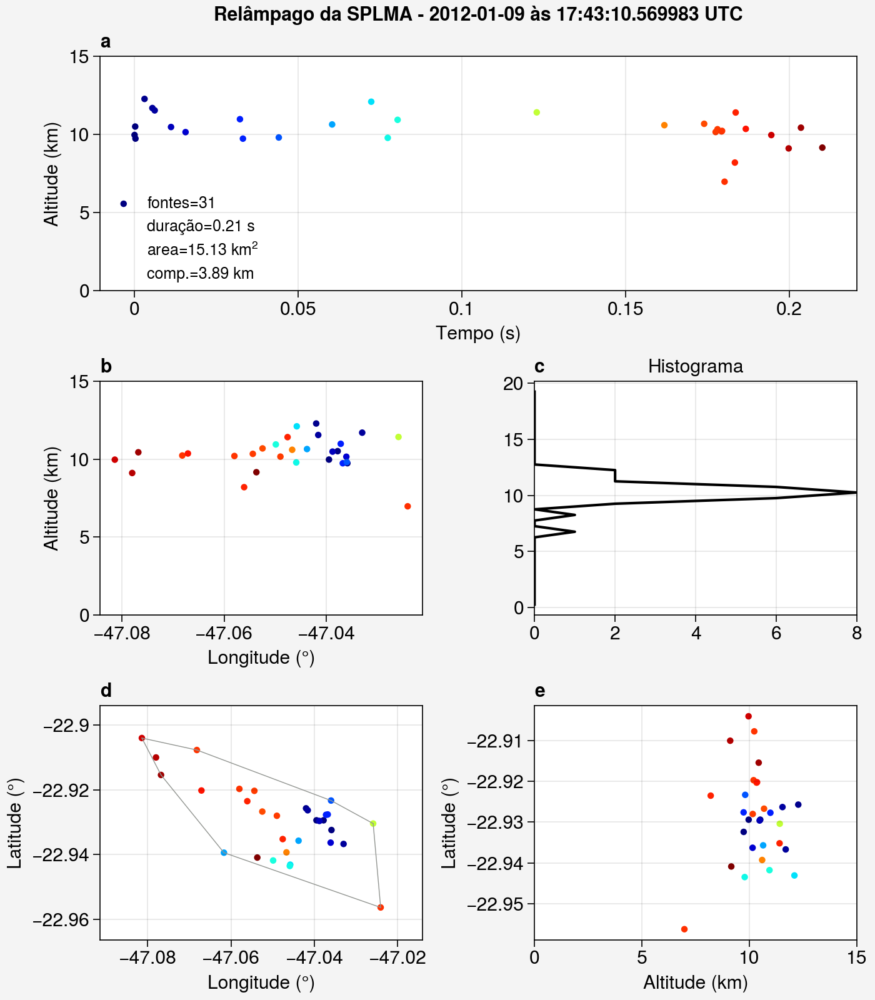

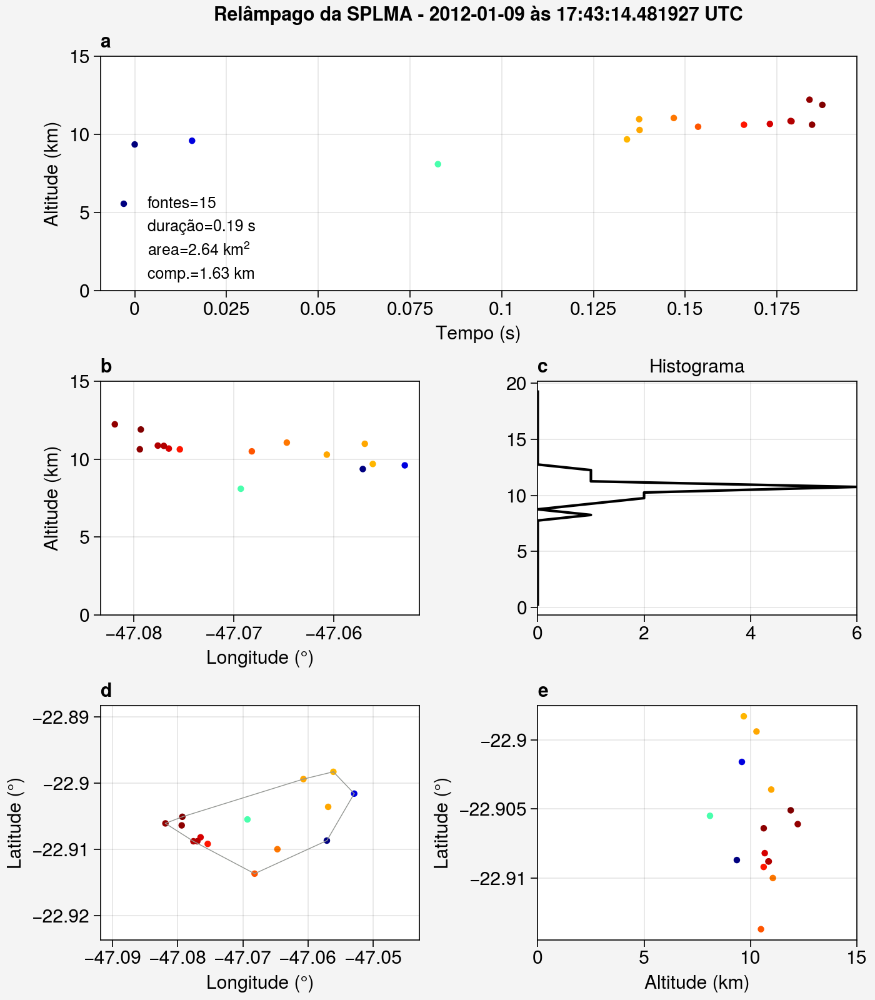

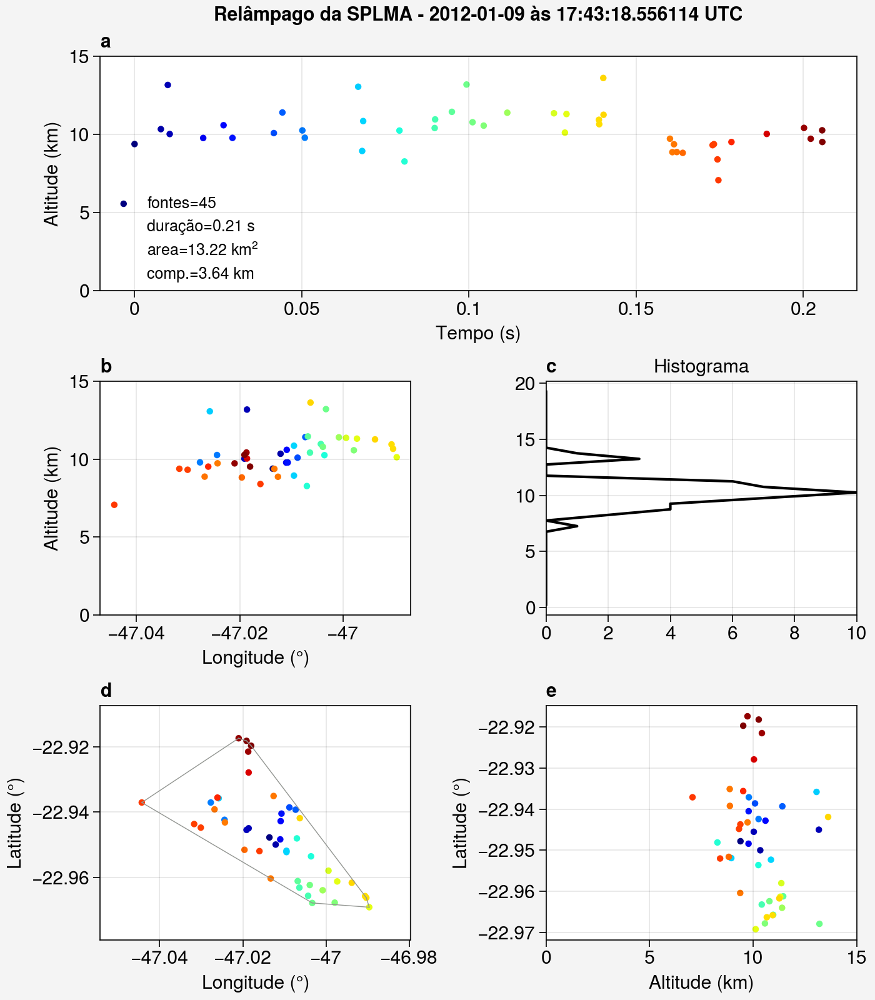

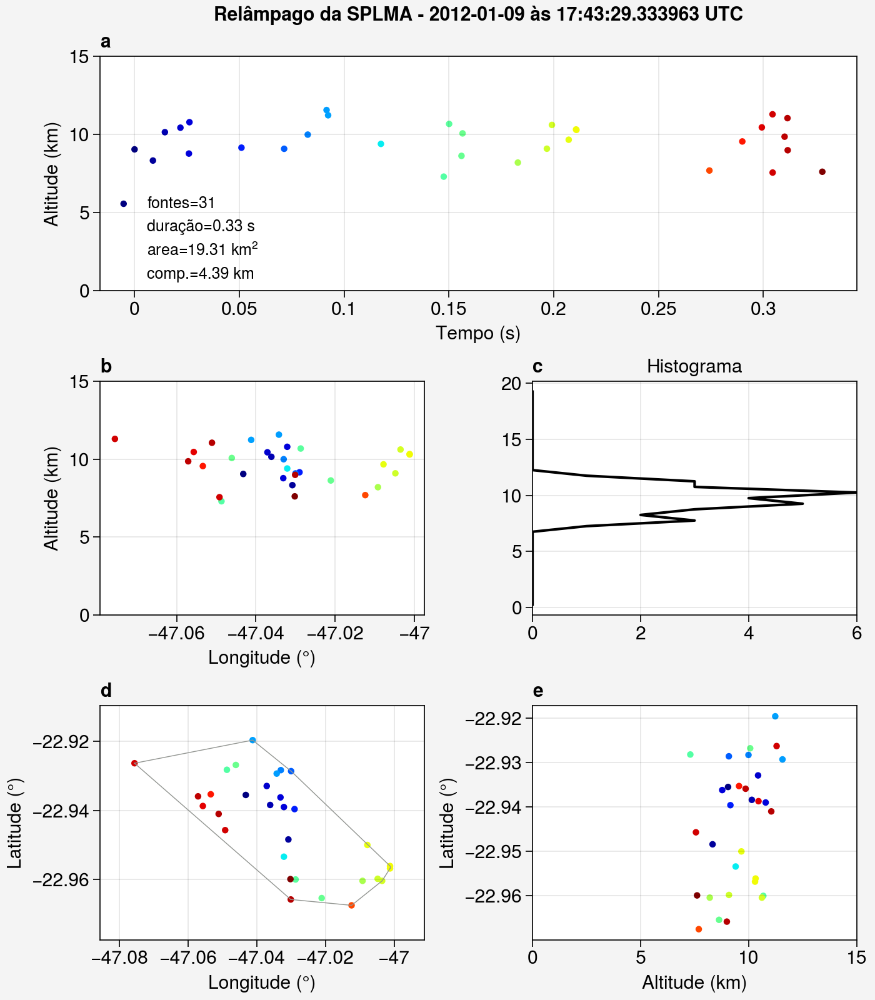

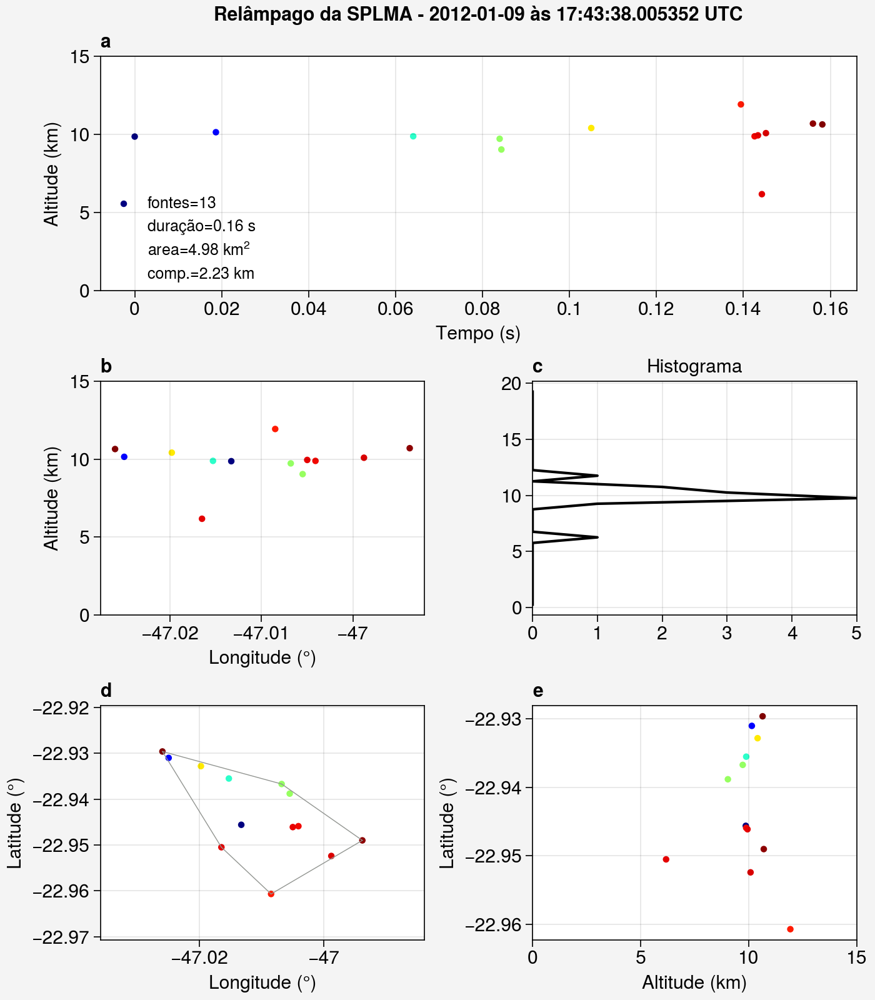

...

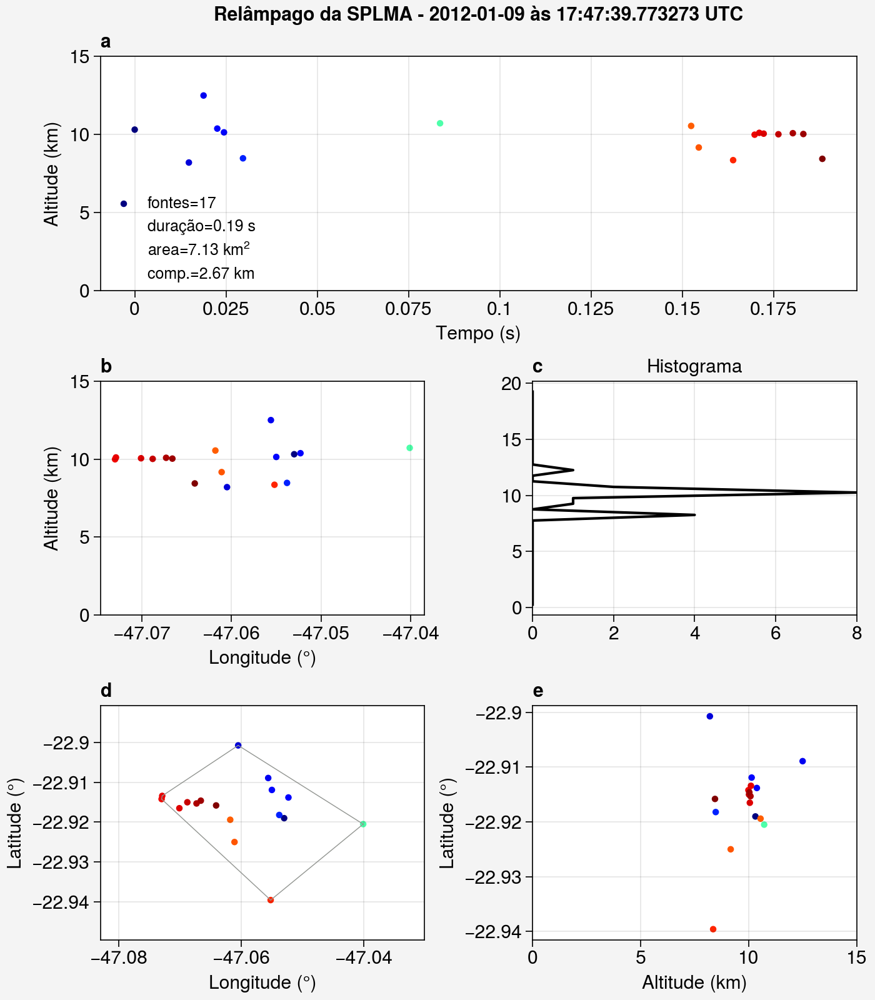

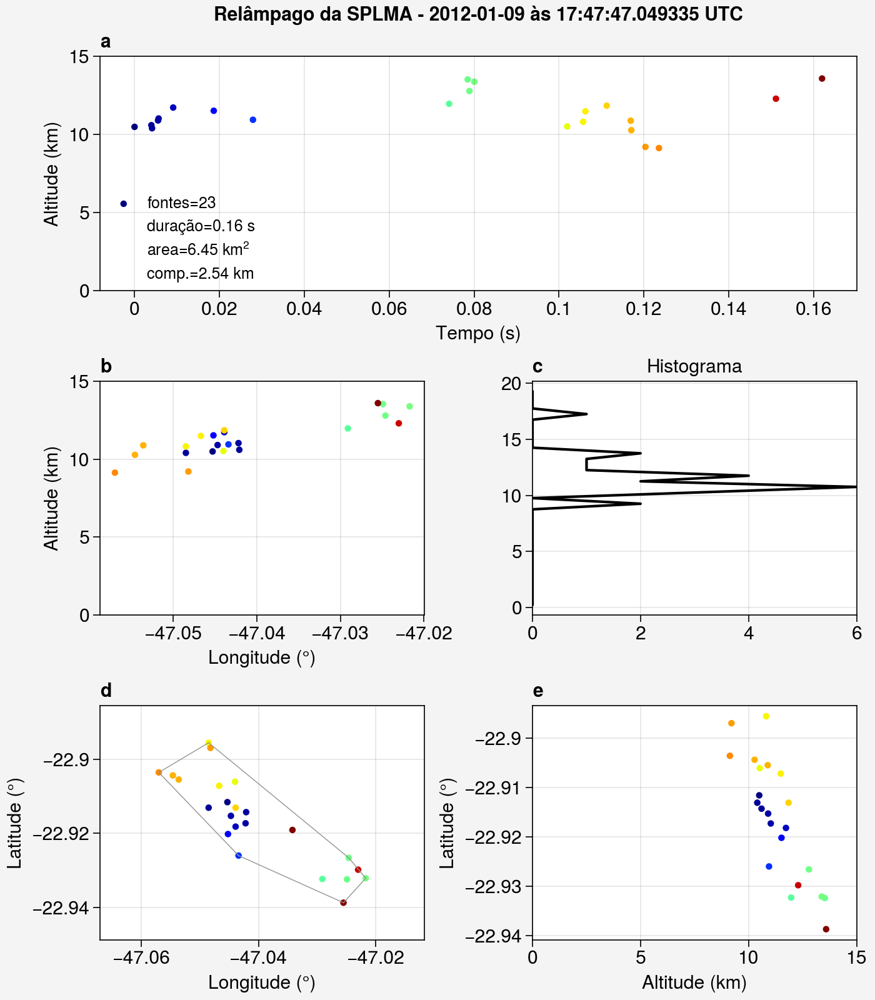

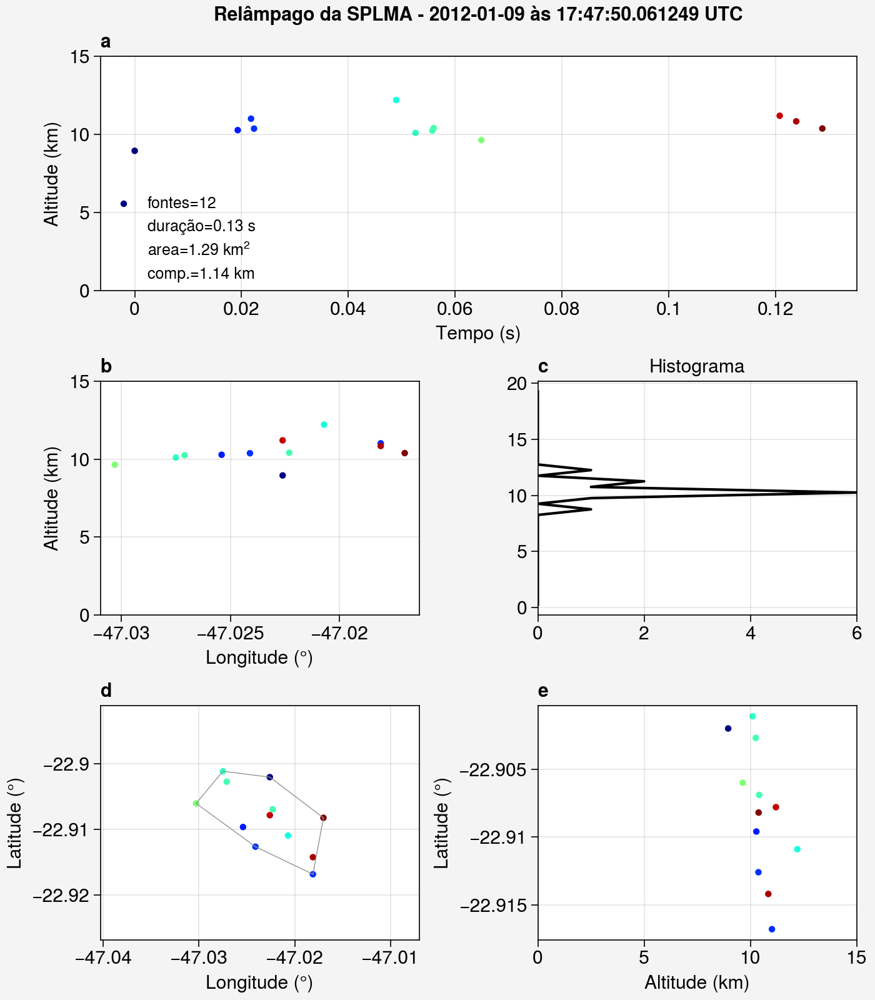

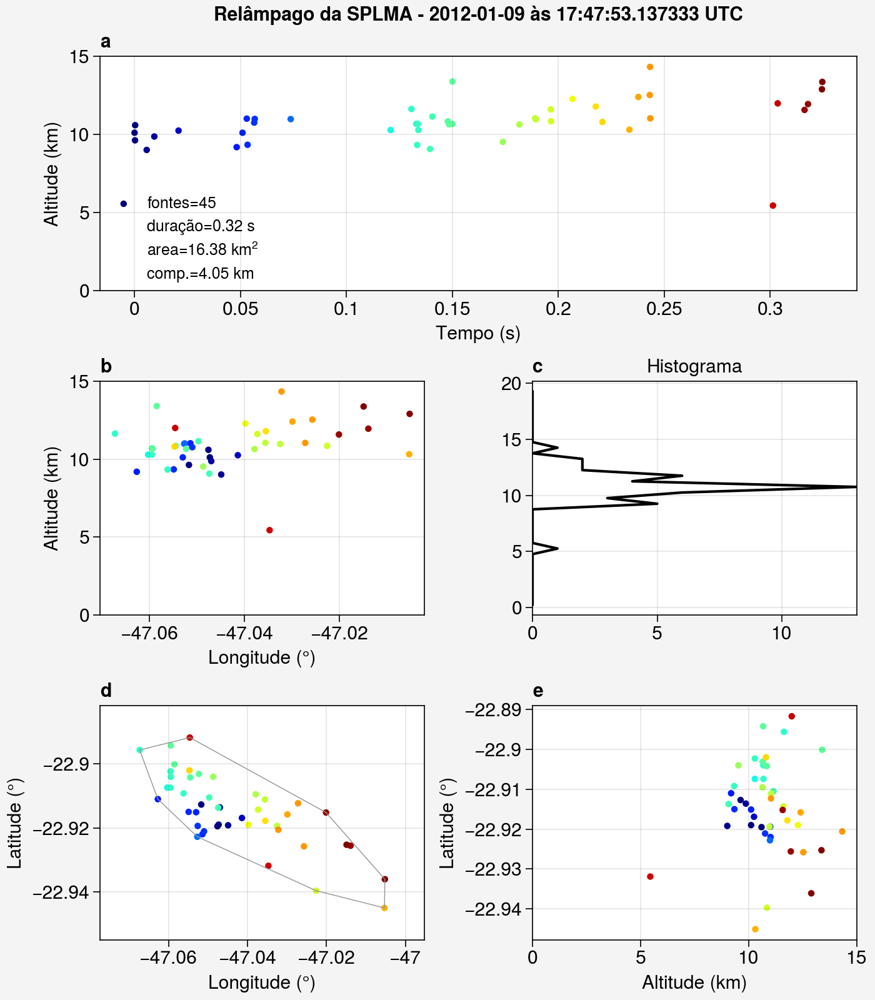

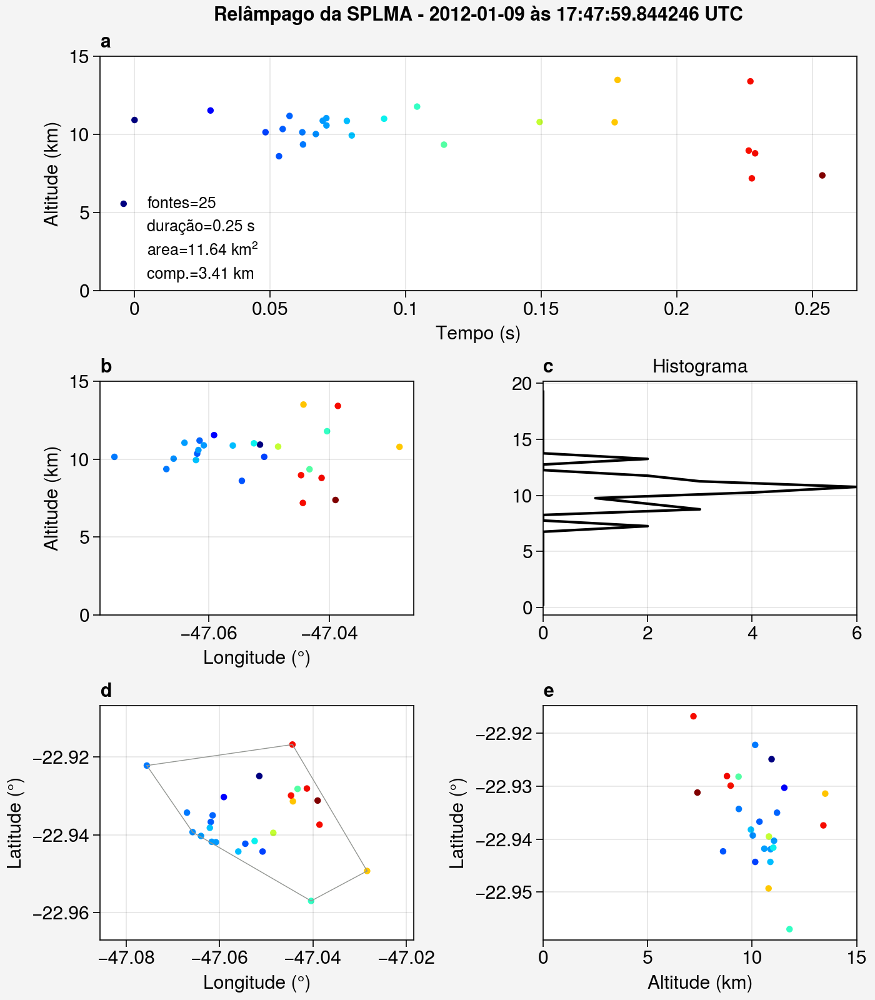

In [ ]:
# ============================================================================================================================================== #
#                                                         PROCESSAMENTO
# ============================================================================================================================================== #
lista_ano, lista_mes, lista_dia, lista_hor, lista_min, lista_seg, lista_lat, lista_lon, lista_alt = [], [], [], [], [], [], [], [], []
total_fontes = 0
val = []

# Se aquele arquivo tem flashes da SPLMA, continua.
if nflashes_lma > 0:

    # ----------------------------------------------------------------------------------- #
    #                1) Loop em cada relâmpago da SPLMA e coloca numa lista
    # ----------------------------------------------------------------------------------- #
    for i in range(1, nflashes_lma+1):

        # inicializa as listas
        lista_ano, lista_mes, lista_dia, lista_hor, lista_min, lista_seg = [], [], [], [], [], [] 
        lista_lat, lista_lon, lista_alt = [], [], [] 

        # monta a identificação do flash (flash1)
        flash_id = 'flash' + str(i)
        print('.... Processando --->>>> ',flash_id )

        # extrai area, duração e comprimento do flash
        area = float(dic_lma[f'{flash_id}']['area'])
        duracao = float(dic_lma[f'{flash_id}']['dur'])
        comprimento = float(dic_lma[f'{flash_id}']['comp'])
          
        # extrai as informações
        ano0, mes0, dia0 = (dic_lma[f'{flash_id}']['ano']), (dic_lma[f'{flash_id}']['mes']), (dic_lma[f'{flash_id}']['dia']) 
        hor0, min0, seg0 = (dic_lma[f'{flash_id}']['hor']), (dic_lma[f'{flash_id}']['min']), (dic_lma[f'{flash_id}']['seg'])
        lat0, lon0 = (dic_lma[f'{flash_id}']['lat']), (dic_lma[f'{flash_id}']['lon'])
        alt0 = (dic_lma[f'{flash_id}']['alt'])

        # insere os dados numa lista
        for iano, imes, idia, ihor, imin, iseg, ilat, ilon, ialt in zip(ano0, mes0, dia0, hor0, min0, seg0, lat0, lon0, alt0):
            lista_ano.append(iano) 
            lista_mes.append(imes) 
            lista_dia.append(idia) 
            lista_hor.append(ihor) 
            lista_min.append(imin) 
            lista_seg.append(iseg) 
            lista_lat.append(ilat) 
            lista_lon.append(ilon) 
            lista_alt.append(ialt) 

        # transforma a lista em DataFrame
        dic = {'ano': lista_ano, 
               'mes': lista_mes,
               'dia': lista_dia,
               'hor': lista_hor,
               'min': lista_min,
               'seg': lista_seg,
               'lat': lista_lat,
               'lon': lista_lon,
               'alt': lista_alt}
        df = pd.DataFrame(dic)
        df = df.apply(pd.to_numeric)   # transforma as colunas do dataframe para numerico

        # extrai quantidade de fontes do arquivo
        nfontes = df.shape[0]

        # ----------------------------------------------- #
        #              Calcula microsegundos 
        #   (transforma de "24.352730" para "352730")
        # ----------------------------------------------- #
        df['segint'] = df['seg'].astype(int)  # extrai a parte inteira dos segundos
        microseg = (df['seg'] - df['segint']) # extrai a parte reaal dos segundos
        microseg = microseg * 1e6             # deixa a parte **real** dos segundos no formato que a função datetime precisa (ou seja, transforma para inteiro): 0.352730 para 352730.0
        df['microseg'] = microseg.astype(int)

        # ----------------------------------------------- #
        #            Loop no datetime 
        # ----------------------------------------------- #
        val = []
        for i, row in enumerate(df.itertuples()):
            if i == 0: time0 = datetime(row.ano, row.mes, row.dia, row.hor, row.min, row.segint, row.microseg)
            time = datetime(row.ano, row.mes, row.dia, row.hor, row.min, row.segint, row.microseg)
            dt = (time - time0)
            val.append(dt.microseconds)
        df['tempo'] = val
        df['tempo'] = df['tempo'].astype(float) * 10e-7  

        # transforma altura de metros para km
        df['alt'] = df['alt']/1000.0

        # ----------------------------------------------- #
        #            Plota figura 
        # ----------------------------------------------- #
        plota_flashlma_individual(path_output, flash_id, df, area, duracao, comprimento)   

        #break 